# **An Introduction to Data Visualization with Python: NYC Open Data Week**
  
This workshop is offered by Barnard's Vagelos Computational Science Center in collaboration with NYC Open Data Week 2022. This workshop does not require previous coding experience, however learning to code takes time—it's okay and expected that not everything will click right away. 

</br>
---
</br>

## **Introduction**

### Roadmap
During this workshop, we'll:
* Familiarize ourselves with the basics of Pandas and Altair using a simple example dataset
* Use public eviction data from NYC Open Data to create basic data visualizations in Altair
* Build on these tools by creating more complex data visualizations using the same dataset 

#### Resources

- [Altair documentation](https://altair-viz.github.io/index.html)
- [NYC Open Data](https://opendata.cityofnewyork.us)
- [Eviction data set](https://data.cityofnewyork.us/City-Government/Evictions/6z8x-wfk4/data)




## **Getting warmed up with Python**

Before we dive into Altair and Pandas, let's familiarize ourselves with some basics of Python.

### Object-oriented programming
Python is an **object-oriented** programming language.  Very basically, this means that we can describe certain objects as having associated methods and characteristics.  We can bundle these attributes into **classes**.

For example, if we define a class called car with characteristics: make, model, color, gas level and methods: refuel tank, repaint body.  Then a yellow cab could be an instance of a car with all of the attributes inherited from membership in this class.

Basic examples of classes (or types) in Python are: strings, integers, floats, lists, etc.



In [ ]:
# This is an example of a comment in Python
# Comments are helpful for structuring and clarifying your code

# Define a string, a string of characters like a word or phrase
"This is a string"

# Assign a variable name to our string
our_string = "This is a string"

# Print our string
print(our_string) # print is a function that can take the value or the variable name as the argument
print("This is a string")

This is a string
This is a string


We will also work with other types of data.

In [ ]:
# Example of strings
our_second_string = "This is also a string"

# Example of an "int" or integer type
a = 5

# Example of a float
b = 6.0

Python functions sometimes expect a certain type of data.  Sometimes, Python functions can take a variety of data types.  In this case, Python will try to "guess" what you mean.  Here, the "+" operation functions differently depending on the type of data we're working with.

In [ ]:
# Take "+" operation, for example

# Adding two integers
a = 6
b = 7

print(a+b)

# Adding a float to an integer
a = 6
b = 7.5

print(a+b)

# Adding two strings
a = "This is"
b = " a string"

print(a+b)

# Adding a string to an integer
a = "This is a string"
b = 5

print(a+b) # Consider: Why doesn't this run?

13
13.5
This is a string


TypeError: ignored

As we've seen, the type of data we work with can influence how Python interprets that data. To ask Python what type an object is, you can write: `print(type(object))`

Let's try it!

In [ ]:
a = "A string"
b = 5/2

print(type(a))
print(type(b))

<class 'str'>
<class 'float'>


We can store data in a number of ways in Python.  Today we'll work briefly with `dictionaries`, which store values in key:value pairs.  Some data formats used for large datasets, like JSON which we'll use later, are based off of dictionaries.  In those cases, `keys` function like columns.  Let's write an example dictionary to get a feel for them.

In [ ]:
# An example dictionary
a_dictionary = {"fruit": "apple", "color":"green", "type":"granny smith"}

# An example dictionary with more data!
a_bigger_dictionary = {
    "fruit":["apple", "orange", "lemon"], 
    "color":["green","orange","yellow"], 
    "type":["granny smith","cara cara", "meyer"]
    }

print(a_bigger_dictionary)

{'fruit': ['apple', 'orange', 'lemon'], 'color': ['green', 'orange', 'yellow'], 'type': ['granny smith', 'cara cara', 'meyer']}


## **Getting Started Coding Data Visualizations With Python**
### Import Libraries

Libraries are packages of functions that give you extra functionality for writing code.  Importing a library allows you to use its powerful pre-written functions, so you don't have to write them from scratch. 

Today, we're using Altair (a Python library for data visualization) and Pandas (a Python library for working with datasets, especially large CSV or Excel-based datasets).

In [ ]:
# Import Altair and Pandas and assign a short nickname to each
import altair as alt
import pandas as pd

Let's practice using Pandas by first writing a dictionary containing some simple practice data:

In [ ]:
# Create a dictionary of keys and values, where the values are arrays/lists

# Our 'keys' will be our column titles
people_dictionary = {
    'name': ['Susan', 'Mark', 'Ciana', 'Diego', 'Eileen'],
    'age': [20, 30, 40, 10, 20]
}

# Print this dictionary to see what it looks like
people_dictionary

{'age': [20, 30, 40, 10, 20],
 'name': ['Susan', 'Mark', 'Ciana', 'Diego', 'Eileen']}

### Pandas and `DataFrame`

- Pandas is a library for "data analysis and manipulation".

- It allows us to perform both simple and complex computations. 

- A `DataFrame` is like a table in a spreadsheet or database, optimized for computation in Python.

We can use Pandas functions to convert certain data formats (like a CSV file, Excel file, or dictionary, for example) into a Pandas dataframe.

In [ ]:
# Call the pandas library DataFrame method to turn the dictionary people_dictionary into a DataFrame 
# and save the DataFrame in a variable called people_df
people_df = pd.DataFrame(people_dictionary)

Now that we've stored our data in a Pandas dataframe, we can use Pandas to explore our dataset.

First, let's say we want to add new column to our dataframe.  We can write  `our_df["new column name"] = new_column_values ` in order to define a new column.

In our current dataset, what if we wanted to add a column that lists a person's first *and* last name?


In [ ]:
# Create a "full name" column that adds the surname "Johnson" to the values in the "name" column
people_df["full name"] = people_df["name"] + " Johnson" #creates column called "full name" which is the value in the "name" column joined with the string "Johnson" 

# Print out the updated dataframe to see what our new column looks like
people_df

,name,age,full name
0,Susan,20,Susan Johnson
1,Mark,30,Mark Johnson
2,Ciana,40,Ciana Johnson
3,Diego,10,Diego Johnson
4,Eileen,20,Eileen Johnson


On your own, try adding a column that assigns a favorite animal to each person.

In [ ]:
# Add a column that assigns a favorite animal to each person
people_df["favorite animal"] = ["cat", "dog", "cat", "bird", "cat"]

### Plot `people_df` with Pandas
Before moving to Altair, let's quickly try to plot our data using the Pandas `plot.bar` method.

To do this, we can use the following syntax:

`dataframe.plot.bar(x = "column name for x axis data", y = "column name for y axis data")`



In [ ]:
# Show plots in the notebook.
%matplotlib inline

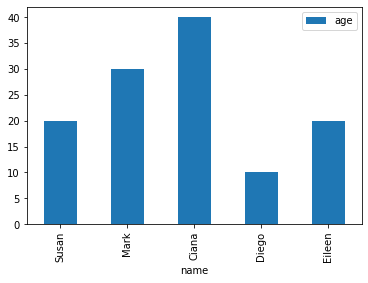

In [ ]:
# Plot name and age on a simple Pandas bar plot
people_df.plot.bar(x = 'name', y = 'age')

### Why use Altair?
- While Pandas excels in computational tasks, its visualization API is somewhat limited.

- The most "comprehensive" data visualization library for Python is `matplotlib`, but it's famously difficult to work with.

- Altair's API is much simpler, but just as powerful. It brings to Python ideas of a "visualization grammar", similar to [JavaScript's Vega package](https://vega.github.io/vega/) and [R's ggplot2](https://ggplot2.tidyverse.org).


### Creating a chart using Altair

Creating a chart in Altair is a three step process:

#### 1. [Specify your Data](https://altair-viz.github.io/user_guide/data.html)

   * Declare a variable (`age_chart`) and create an instance of the Altair `Chart` object by calling `alt.Chart()`:
   
    ```Python
    age_chart = alt.Chart()
    ```
       
       
   * Pass in our data (`people_df`):
   
    ```Python
    age_chart = alt.Chart(people_df)
    ```
    
    
#### 2. Tell Altair what type of plot (or ["marks"](https://altair-viz.github.io/user_guide/marks.html)) you want to use
   * `Marks` specify how data attributes "should be represented on the plot":
   
       * Options include: `mark_area`, `mark_bar`, `mark_circle`, `mark_line`, among others.
       * Marks can be encoded as well.
       
       
   * For now, we'll make a bar plot by writing: 
   
    ```Python
    age_chart = alt.Chart(people_df).mark_bar()
    ```
       
       
#### 3. [Encode your data](https://altair-viz.github.io/user_guide/encoding.html)
   * Encoding is how you tell Altair which data you want to represent in your chart (the encoding acts as a map between the data and the visualization)
   
   * In our simple example, we encode the `x` & `y` values as name and age:
     
    ```Python
    age_chart = alt.Chart(people_df).mark_bar().encode(
        x='name',
        y='age'
    )  
    ```

Let's run this all together to generate a chart similar to the one we made above using Pandas.

In [ ]:
# Plot name and age using Altair's Chart method

age_chart = alt.Chart(people_df).mark_bar().encode(
   x='name',
   y='age'
) 

# Show the plot
age_chart

alt.Chart(...)

#### We can also play with color

Let's try to do this two ways:
1. Enter a color into the empty parentheses next to the mark field: `mark_bar(color = "color_name")`
2. Specify a color in your encoding based off of a data field: `color = "data"`

**Example 1: Specify color in mark_bar()**

In [ ]:
alt.Chart(people_df).mark_bar(color = 'green').encode(
    x='name',
    y='age',
)

alt.Chart(...)

**Example 2: specify data-dependent color in encode()**

In [ ]:
alt.Chart(people_df).mark_bar().encode(
    x='name',
    y='age',
    color = 'age' #or color = alt.Color('age', scale=alt.Scale(scheme="greens"))
)

alt.Chart(...)

Note that in the first example, where color is specified as an argument of `mark_bar()`, the color is fixed.  In the second example, where color is specified in `encode()`, color is a function of some data (e.g., age).

### Working with JSON data

[Per Wikipedia](https://en.wikipedia.org/wiki/JSON) JSON is:

> a data interchange format, that uses human-readable text to store and transmit data objects consisting of attribute–value pairs and array data types (or any other serializable value)

JSON data is extremely common across the web, so learning to work with it is important. At its core, a JSON is composed of arrays and attribute-value pairs, similar to a Python dictionary.

### The Basic Structure of JSON:

- The entire dataset is enclosed in an array: **[ ]**
- Each individual JSON object is enclosed in braces: **{ }**
- The JSON objects are composed of attribute-value (alternatively, key-value) pairs:
    - `"year":"1979"`

Let's take a second to convert a simple Python dictionary to a JSON object.  First, we'll write a dictionary:

In [ ]:
# Make a Python dictionary
a_dictionary = {"red": "balloon", "brown": "dog"}

print(a_dictionary)
print(type(a_dictionary))

{'red': 'balloon', 'brown': 'dog'}
<class 'dict'>


Now, use Python's JSON library to convert our dictionary into a JSON.  What happens if you print the "type" of this new object?

In [ ]:
import json

# Convert our dictionary to a JSON object
a_json = json.dumps(a_dictionary)

print(a_json) 
print(type(a_json)) # Note that our new object is a string

{"red": "balloon", "brown": "dog"}
<class 'str'>


Note that our converted dataframe now looks very similar to our original dictionary.  This time, however, the dictionary-looking object is actually a string.

## **Working with Public Data: Eviction Data Example**

Now that we've become a little more familiar with Altari and Pandas, let's start working with a public dataset. We'll use a JSON dataset on eviction from NYC Open Data.

To import the [NYC Open Data: Evictions](https://data.cityofnewyork.us/City-Government/Evictions/6z8x-wfk4) dataset:
- Open the link above,
- click on **API** in the toolbar,
- click **Copy** to copy the URL endpoint,
- paste the url in another windows and navigate to it

Once we have the data located at a URL, we can use Pandas to "read" the JSON data into a dataframe. We will use the syntax:

```
df = pd.read_json(url_where_data_is_hosted)
```
Using this method, we'll import the eviction dataset and store it as a Pandas dataframe.


In [ ]:
# We can assign the url to a variable for short
data_url = "https://data.cityofnewyork.us/resource/6z8x-wfk4.json" #if you go to this url in your browswer you will see a page of JSON data

# Now, use the pd.read_json() method to create a new dataframe and call it eviction_df
eviction_df = pd.read_json(data_url)

### Create a histogram of evictions over time

Recall that in our earlier example, we used the following syntax to plot our data:

```
chart = alt.Chart(dataframe).mark_bar().encode(
        x='x-data',
        y='y-data'
    )  
```
What if we want to plot the number of evictions that occured on a give date or over a given time period? Our `x` will be time, which we can find in our dataset.  But what data should we use for our `y`?

In [ ]:
# Make a bar graph of the eviction data
alt.Chart(eviction_df).mark_bar().encode(
    x = 'executed_date', #x axis is encoded as executed_date, read as Temporal data (i.e., a date or time)
    y = 'count()' #y axis is the number of evictions that occured on that date
)

alt.Chart(...)

What looks off in this plot?



Altair has interpretted our "executed date" as nominal data.  We can tell Altair what type of data we're working with by writing: `x = "data:data_type_shorthand"`. Shorthands for datatypes that Altair can interpret are given [here](https://altair-viz.github.io/user_guide/encoding.html):


Data Type | Shorthand Code | Description
----------|----------------|----------
quantitative | Q | a continuous real-valued quantity 
ordinal      | O | a discrete ordered quantity 
nominal      | N | a discrete unordered category 
temporal     | T | a time or date value
geojson      | G | a geographic shape



What happens if we try to generate this plot again, but with "executed_date" specified as temporal data?

In [ ]:
# Make a bar graph of the eviction data, with "executed_date" read as temporal data
alt.Chart(eviction_df).mark_bar().encode(
    x = 'executed_date:T', # x axis is encoded as executed_date, read as temporal data (i.e., a date or time)
    y = 'count()' # y axis is the number of evictions that occured on that date
)

alt.Chart(...)

This plot still looks a little unclear—the bars, each representing a day, are quite narrow for the scale of the x-axis. How can we adjust?

What if we want to look at evictions over the course of a year or months? We can use Pandas to "bin" data by year.

In [ ]:
# Arrange data by year using Pandas

# Add a new column called "year" that pulls the year from the "executed_date" entry in a given row
eviction_df['year'] = pd.DatetimeIndex(eviction_df['executed_date']).year
eviction_df['month'] = pd.DatetimeIndex(eviction_df['executed_date']).month

# Create a chart of evictions vs. years
alt.Chart(eviction_df).mark_bar().encode(
    x = 'year:T', # x axis is encoded as the year, try both T and N
    y = 'count()' # y encoding
)

alt.Chart(...)

Did you notice any differences between the encoding the year as Nominal or Temporal data? 

If we encode the year as temporal data, it's  read as the first day of the year like: year/01/01 00:00:00, so it is displayed as a day with large gaps between "years."  In this case, it makes sense to encode the "year" as nominal data, because the year is acting less as a date and more as a category.

What if we want to plot over both year *and* month?  Let's make a new column with this data.

In [ ]:
# Make a new column with year/month data for each eviction
eviction_df['year_month'] = eviction_df['year'].astype(str) + '/' + eviction_df['month'].astype(str)

# Print the head to see if our new column looks how we want it to look
print(eviction_df.head())

  court_index_number  docket_number   eviction_address eviction_apt_num  \
0           70146/17          22746       963 E 101 ST                1   
1           54899/17          12479       376 BROADWAY              NaN   
2           27373/18          82635  3165 VILLA AVENUE                4   
3           62967/17         167814   85-21 60TH DRIVE               1F   
4          250702/19          95547    2371 2ND AVENUE               24   

             executed_date marshal_first_name marshal_last_name  \
0  2017-10-17T00:00:00.000               Gary              Rose   
1  2017-10-11T00:00:00.000             Edward             Guida   
2  2018-08-09T00:00:00.000             Justin          Grossman   
3  2017-09-26T00:00:00.000             Alfred          Locascio   
4  2019-07-09T00:00:00.000             Justin          Grossman   

  residential_commercial_ind    borough  eviction_zip  ...  longitude  \
0                Residential   BROOKLYN         11236  ... -73.896343   


Now let's plot using our new column!

In [ ]:
# Plot evictions over time, binned by month
alt.Chart(eviction_df).mark_bar().encode(
    x = 'year_month:T', # x axis is encoded as the year, show both N and T 
    y = 'count()' 
)

alt.Chart(...)

We can store our chart in a variable name as follows:

In [ ]:
# Save the chart as a variable
plot1 = alt.Chart(eviction_df).mark_bar().encode(
    x = 'year_month:T', # x axis is encoded as the year, read as temporal values
    y = 'count()' 
)

plot1

alt.Chart(...)

Storing the chart as a variable can be handy, because Altair can interpret operations on charts, like addition.

Let's make a second plot (a line plot, for example) and see what happens when we "add" it to our first plot.

In [ ]:
# Make a line chart using the year/month data and assign a variable name to it
plot2 = alt.Chart(eviction_df).mark_line(color = 'green').encode(
    x = 'year_month:T',
    y = 'count()' 
)

plot2

alt.Chart(...)

**Interpretation warning**: Note that because we've made a line chart, the period with no/low data (during the 2020-2021 eviction moratorium in NYC) is represented as data-ful.  However, the dataset actually contains no data for this period.  Because they have the same axes, we can plot both the bar chart and the line chart together to compare:

In [ ]:
# Add plot1 and plot2
plot1 + plot2

alt.LayerChart(...)

# Investigating evictions by boroughs
What if we would like to compare eviction data by boroughs? To do this, we can use data transformations in Altair to filter the evictions data according to boroughs. (More information on data transformation in Altair is [here](https://altair-viz.github.io/user_guide/transform/index.html).)

We'll use the `transform_filter()` method that selects a subset of data based on a condition. The argument to `transform_filter()` stipulates the conditions with which we are restricting our data. 

The `FieldEqualPredicate` evaluates whether a field (the variable of the dataframe to filter by) is equal to a particular value. More information on the syntax for `transform_filter()`, including other possible field predicates is [here](https://altair-viz.github.io/user_guide/transform/filter.html#user-guide-filter-transform).


Let's try plotting evictions in just Manhattan:

In [ ]:
# Bar plot of evictions in Manhattan, using Altair to select data for this borough

manhattan_evictions = alt.Chart(eviction_df, title="Evictions in Manhattan, using Altair").mark_bar(color = "red" ).encode(
     x = 'year_month:T',
     y = 'count()'
).transform_filter(
    alt.FieldEqualPredicate(field='borough', equal='MANHATTAN')
)

manhattan_evictions


alt.Chart(...)

We could also use Pandas to select data by borough. To do this, we can use the following syntax: `selected_data = our_df.loc[our_df["column name"] == column_value]`

In [ ]:
# We can also use Pandas to select data

manhattan_df = eviction_df.loc[eviction_df['borough'] == 'MANHATTAN']

manhattan_evictions_pd = alt.Chart(manhattan_df, title="Evictions in Manhattan (using Pandas)").mark_bar(color = "red" ).encode(
     x = 'year_month:T',
     y = 'count()'
)

manhattan_evictions_pd

alt.Chart(...)

For the sake of consistency, we'll use the Altair method going forward today.

Now try and see if you can make bar plots of the evictions by year for each of the other boroughs separately, using the following colors for the boroughs.

*   BROOKLYN: blue
*   QUEENS: orange
*   BRONX: grey
*   STATEN ISLAND: green


*Note that the names of the boroughs are capitalized in the dataframe while the field, "borough" is not*

In [ ]:
# Plot evictions in Brooklyn
brooklyn_evictions = alt.Chart(eviction_df, title="Evictions in Brooklyn").mark_bar(color = "blue" ).encode(
     x = 'year_month:T',
     y = 'count()'
).transform_filter(
    alt.FieldEqualPredicate(field='borough', equal='BROOKLYN')
)

brooklyn_evictions


alt.Chart(...)

In [ ]:
# Plot evictions in Queens

queens_evictions = alt.Chart(eviction_df, title="Evictions in Queens").mark_bar(color = "orange" ).encode(
     x = 'year_month:T',
     y = 'count()'
).transform_filter(
    alt.FieldEqualPredicate(field='borough', equal='QUEENS')
)

queens_evictions


alt.Chart(...)

In [ ]:
# Plot evictions in the Bronx

bronx_evictions = alt.Chart(eviction_df, title="Evictions in the Bronx").mark_bar(color = "grey" ).encode(
     x = 'year_month:T',
     y = 'count()'
).transform_filter(
    alt.FieldEqualPredicate(field='borough', equal='BRONX')
)

bronx_evictions


alt.Chart(...)

In [ ]:
# Plot evictions in Staten Island

staten_island_evictions = alt.Chart(eviction_df, title="Evictions in Staten Island").mark_bar(color = "green" ).encode(
     x = 'year_month:T',
     y = 'count()'
).transform_filter(
    alt.FieldEqualPredicate(field='borough', equal='STATEN ISLAND')
)

staten_island_evictions


alt.Chart(...)

Notice that the plot for the Bronx has been formatted slightly differently (look at the x-axis), even though our instructions to Altair were the same.  Because Altair acts like a visualization "grammar", it handles all the details of formatting on the back-end, so it will try to optimize formatting depending on the data we give it.  However, since all of the earlier graphs use the same axes, when we overlay the plots for each borough, they have uniform styling.

Now, let's compare across boroughs by overlaying all the bar plots onto a single graph. We can combine plots by adding plots with the same axes with each other.

In [ ]:
#combine all borough plots by overlaying previous graphs

combined_plot = manhattan_evictions + brooklyn_evictions + queens_evictions + bronx_evictions + staten_island_evictions
combined_plot.properties(title = "Evictions Across Boroughs")

alt.LayerChart(...)

This looks a little messy: we can't see all the data because some of the bars are covering each other. In order to see data from each borough, we can try a different technique.  Earlier, we tried color-coding by age for our name-age plot.  Let's have Altair do the same thing here, but for borough.

In [ ]:
# Create a layered bar chart with color determined by borough
layered_evictions = alt.Chart(eviction_df, title="Evictions Across Boroughs (2017-2022)").mark_bar().encode(
     x = 'year_month:T',
     y = 'count()',
     color='borough:N'
)

layered_evictions

alt.Chart(...)

This is much more clear! Now, let's fix up those axis titles.

In [ ]:
# Create a layered bar chart and specify axis titles
layered_evictions = alt.Chart(eviction_df, title="Evictions in NYC by Borough (2017-2022)").mark_bar().encode(
     x = alt.X('year_month:T', axis=alt.Axis(title="Date executed (by month)")),
     y = alt.Y('count()', axis=alt.Axis(title="Number of evictions")),
     color=alt.Color('borough:N', legend=alt.Legend(title="Borough"))
)

layered_evictions

alt.Chart(...)

We can also play around with different color schemes. Let's say you want to color by a continuous quantitative value (like # of evictions) using a gradient color scheme.  In the argument of `alt.Color()`, you can write `scale = alt.Scale(scheme = "scheme_name")` to specify your color scheme.  Altair uses [Vega color schemes](https://vega.github.io/vega/docs/schemes/).

Let's try this using a simple "reds" scheme, so that months during which a high number of evictions occurred are shown in dark red.

In [ ]:
# Create a bar chart with color as a function of count()
evictions_gradient = alt.Chart(eviction_df, title="Evictions in NYC (2017-2022)").mark_bar().encode(
     x = alt.X('year_month:T', axis=alt.Axis(title="Date executed (by month)")),
     y = alt.Y('count()', axis=alt.Axis(title="Number of evictions")),
     color=alt.Color('count()', scale=alt.
                      Scale(scheme = 'reds'))
    )

evictions_gradient

alt.Chart(...)

We can also implement conditional coloring using Altair's `alt.condition()` syntax. Normally, we can write:

```
color=alt.condition(
        ((alt.datum.data_field condition)),
        alt.value('color_if_condition_is_true'),
        alt.value('color_if_condition_is_false')
     )
```
However, because the datum (or data field) that we want to condition on, counts(), is not in the dataset, we'll have to use Pandas to create a new dataset with this value. (We could also have used this method before, instead of using Altair's `count()`. If you continue working with Pandas, its aggregation functions and `group_by()` function are worth exploring.) 

Don't worry if not everything in this example clicks right away—this is just to give you a feel for some of the data manipulation and visualization possibilities using Pandas and Altair.


In [ ]:
# Conditional color-coding using Pandas

# Instantiate a new dataframe with columns "date" and "count"
new_df = pd.DataFrame(columns = ["date", "count"])

# Fill the new dataframe with values aggregated from the eviction dataframe
new_df["count"] = eviction_df["year_month"].value_counts().to_frame()
new_df["date"] = new_df.index # The above Pandas method .value_counts() returns a Series object, where data is the index. Convert this index to a column.

# Check new dataframe
print(new_df.head())

# Use Altair to implement conditional coloring
highlighted_evictions = alt.Chart(new_df, title="Evictions in NYC (2017-2022)").mark_bar().encode(
     x = alt.X('date:T', axis=alt.Axis(title="Date executed (by month)")),
     y = alt.Y('count', axis=alt.Axis(title="Number of evictions")),
     color=alt.condition(
        ((alt.datum.count >= 30)), # If number of evictions/month >= 30:
        alt.value('red'),     # Highlight that bar in red.
        alt.value('gray')   # Else: keep that bar gray.
     )
    )

highlighted_evictions

          date  count
2019/5  2019/5     44
2018/8  2018/8     42
2018/6  2018/6     36
2018/4  2018/4     36
2017/3  2017/3     35


alt.Chart(...)

Now that we've covered some of the basics of Python, Pandas, and Altair, we hope you continue on your coding and data visualization journey! If you want to continue developing some of the skills you've already built up today, here are some suggestions of further exercises and lines of inquiry that you might pursue:


*   Today we covered JSON data, but GeoJSON data is another type of JSON-formatted data that allows you to map data onto geographic maps to identify spatial trends.
*   You might play around with conditional coloring or other Altair methods like transform_filter() to highlight different features in your data. 
*   Population isn't evenly distributed across boroughs, so the data represent number of evictions, rather than eviction rate.  How might you normalize the data? (Hint: you might consider looking at another public dataset like [this one](https://data.cityofnewyork.us/City-Government/New-York-City-Population-by-Borough-1950-2040/xywu-7bv9/data).)
*   What if you want to identify relationships between the eviction dataset (or another one of your choosing) and some other dataset (like demographic, health, or environmental data)? You might consider merging on a shared field (like borough, zip code, or date) in order to compare trends along a shared axis. A caveat: you may have to clean or normalize your data first!

